# Распознавание объектов

Распознавание объектов на картинках является одной из самых распространённых проблем машинного обучения. Сегодня мы познакомимся с очень популярной моделью — YOLO.

YOLO (You Only Look Once) — это семейство моделей, которые стали популярны благодаря легковесности и качеству предсказаний. Такие характеристики позволяют использовать YOLO для задач распознавания объектов в реальном времени и на портативных устройствах.

Что делает YOLO, когда учится на данных (простыми словами):

1: Обычно картинки приводят под размер 416x416 перед началом обучения нейронной сети.

2: Делим картинку (пока что мысленно) на клетки. В YOLOv3-4 принято делить на клетки размером 13x13 (о различных скейлах поговорим чуть позже, чтобы было понятнее).

![alternative_text](https://hsto.org/r/w1560/webt/ci/lq/ff/cilqffcvpw7rycahb_j5hwts4as.png)

Теперь фокусируемся на эти клеточках, на которые мы разделили картинку/кадр. Такие клетки, которые называются grid cells, лежат в основе идеи YOLO. Каждая клетка является «якорем», к которому прикрепляются bounding boxes. То есть, вокруг клетки рисуются несколько прямоугольников для определения объекта (поскольку непонятно, какой формы прямоугольник будет наиболее подходящим, их рисуют сразу несколько и разных форм) и его позиции, ширина и высота вычисляются относительно центра этой клетки.

![alternative_text](https://hsto.org/r/w1560/webt/0f/_-/1w/0f_-1wtt4qkwxr6bww4hpysnuwc.jpeg)

3: Картинка из датасета прогоняется через нашу нейронную сеть. (Заметим, что кроме картинки в тренировочном датасете у нас должны быть определены позиции и размеры настоящих bounding boxes для объектов, которые есть на ней. Это называется «аннотация» и делается это в основном вручную.)

Внутри у YOLO достаточно сложная структура, которая на выходе нам выдает:
1. координаты полученных «объектов»;
2. уверенность (от 0 до 1) в том, что это за объект.

![alternative_text](https://hsto.org/r/w1560/webt/bj/ld/wm/bjldwmnqycbox81gunaedgon4go.jpeg)

Сегодня мы посмотрим, как работают такие модели.

Загрузим нашу модель из репозитория [Ultralytics/yolov5](https://github.com/ultralytics/yolov5).

In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

fatal: destination path 'yolov5' already exists and is not an empty directory.


/Users/mark-khubbatulin/Library/Python/3.9/lib/python/site-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


/Users/mark-khubbatulin/side-project/sber-21-rostelecom/DSpy03.ID_1421594/src/yolov5
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import torch
print(torch.__version__)

2.2.0


In [3]:
import os

import cv2
import torch
from PIL import Image

import matplotlib as plt

Загрузим модель из torch.hub

In [4]:
model = torch.hub.load('ultralytics/yolov5', 'yolov5s');

Using cache found in /Users/mark-khubbatulin/.cache/torch/hub/ultralytics_yolov5_master
/Users/mark-khubbatulin/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:34: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
YOLOv5 🚀 2024-6-25 Python-3.9.6 torch-2.2.0 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


В папке images находятся изображения, которые мы будем давать нашей модели для детекции.

In [5]:
def get_path_names(folder):
    # list files in img directory
    files = os.listdir(folder)
    images = []
    for file in files:
        # make sure file is an image
        if file.endswith(('.jpg', '.png', 'jpeg')) and not file.startswith('._'):
            img_path = os.path.join(folder, file)
            images.append(img_path)
    
    return images

In [7]:
images = get_path_names('путь к папке datasets/images/good/')
images

['../../datasets/images/good/people.jpeg',
 '../../datasets/images/good/zidane.jpg',
 '../../datasets/images/good/bus.jpg']

Посмотрим, как отработает наша модель на этих картинках.

In [8]:
images_loaded = []
for image_filepath in images:
    image = cv2.imread(image_filepath)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    images_loaded.append(image)

In [9]:
results = model(images_loaded, size=640)

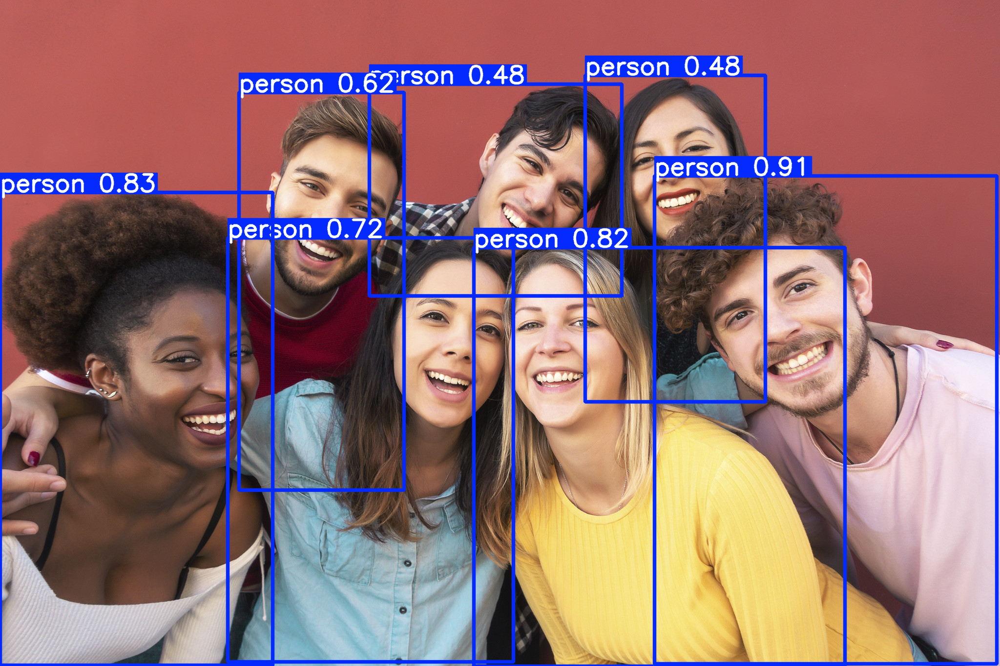

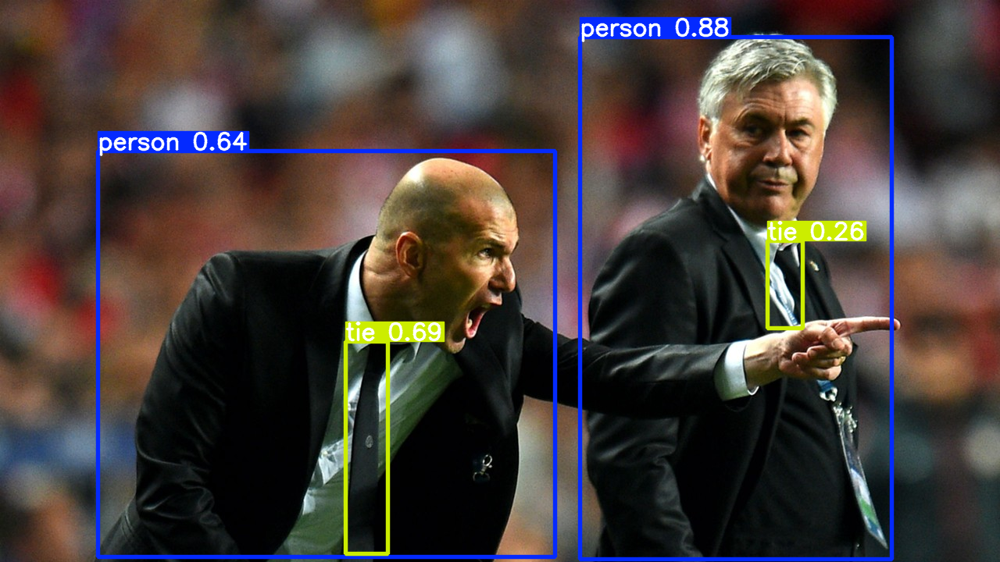

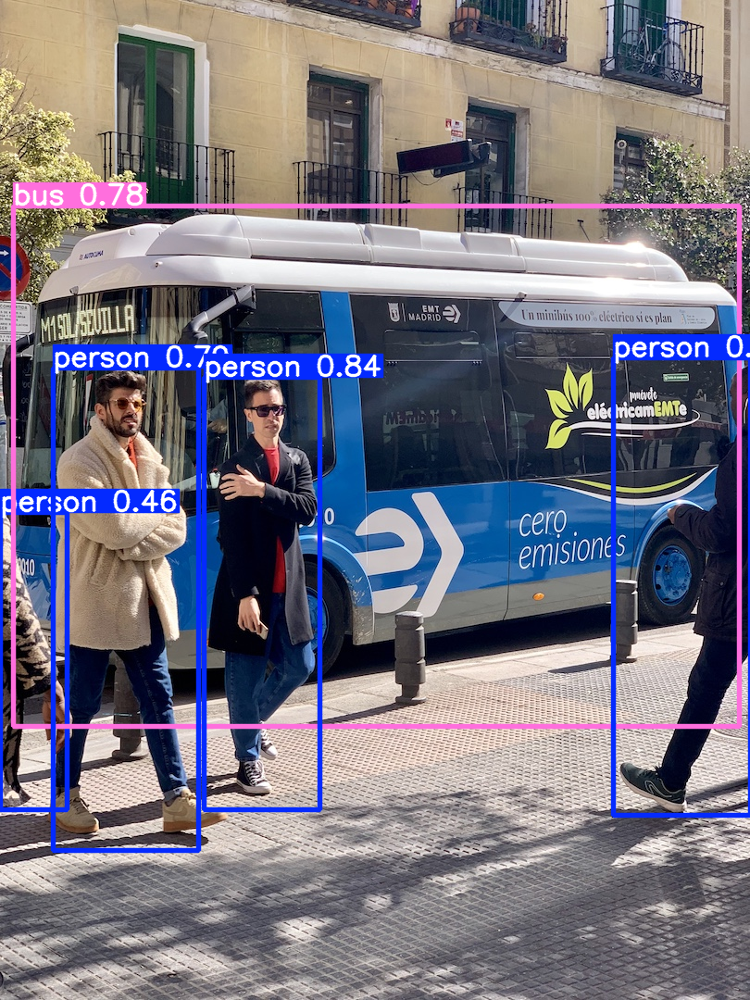

In [10]:
results.show()

Если же мы выведем результаты нашей модели, мы увидим, что в ней находятся координаты рамок, в которых модель нашла объект, вычисленная вероятность, соответствующая этому объекту и класс(тип объекта).

In [11]:
results.print()

image 1/3: 1365x2048 7 persons
image 2/3: 720x1280 2 persons, 2 ties
image 3/3: 1080x810 4 persons, 1 bus
Speed: 21.9ms pre-process, 98.0ms inference, 0.9ms NMS per image at shape (3, 3, 640, 640)


In [12]:
results.xyxy[0]
results.pandas().xyxy[0]

,xmin,ymin,xmax,ymax,confidence,class,name
0,1340.203979,360.051910,2041.368896,1360.035522,0.909696,0,person
1,0.000000,394.974274,558.315918,1363.661377,0.831724,0,person
2,970.612000,507.804688,1730.682251,1365.000000,0.823960,0,person
3,466.681335,487.189850,1051.450073,1356.090576,0.715035,0,person
4,489.370514,189.646881,827.976379,1004.829712,0.618087,0,person
5,1198.614990,154.688034,1567.381592,823.077332,0.481227,0,person
6,756.943176,172.792145,1273.734131,606.872070,0.476611,0,person


In [13]:
results.xyxy[1]
results.pandas().xyxy[1]

,xmin,ymin,xmax,ymax,confidence,class,name
0,742.896973,47.978546,1141.142212,716.822998,0.880724,0,person
1,442.038971,437.349854,496.719574,709.882935,0.687267,27,tie
2,125.215027,193.606812,710.841309,713.070312,0.642235,0,person
3,982.893311,308.404541,1027.329590,420.230103,0.263046,27,tie


Как у любой модели, у YOLO есть свои ограничения.
Взгляните на следующий пример:

In [14]:
images = get_path_names('путь к папке datasets/images/bad')
images

['../../datasets/images/bad/lots_of_people.jpeg',
 '../../datasets/images/bad/up.jpeg']

In [15]:
images_loaded = []
for image_filepath in images:
    image = cv2.imread(image_filepath)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    images_loaded.append(image)

In [16]:
results = model(images_loaded, size=640)

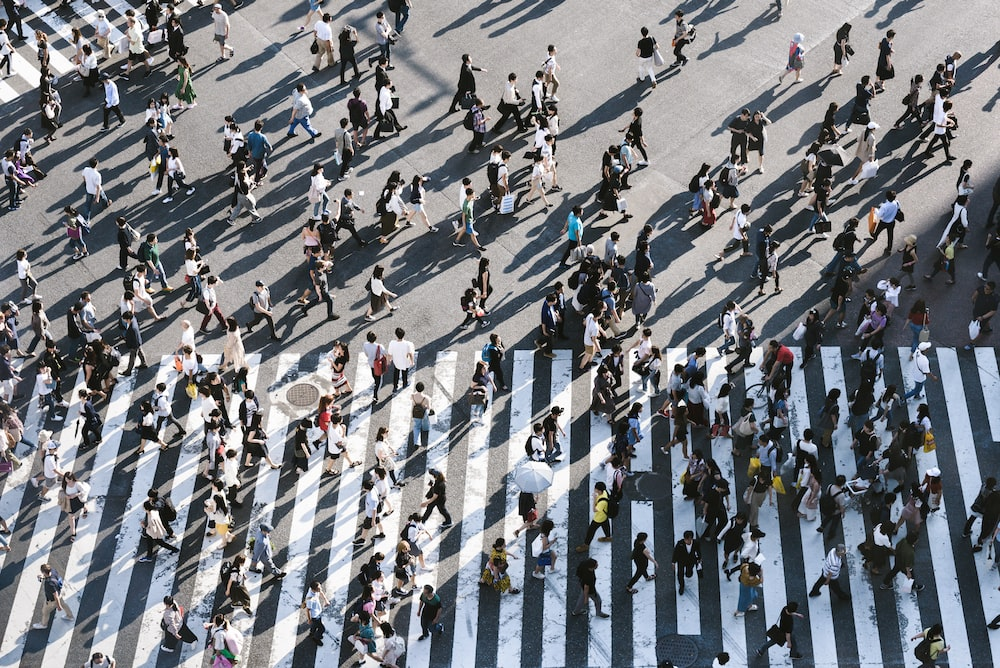

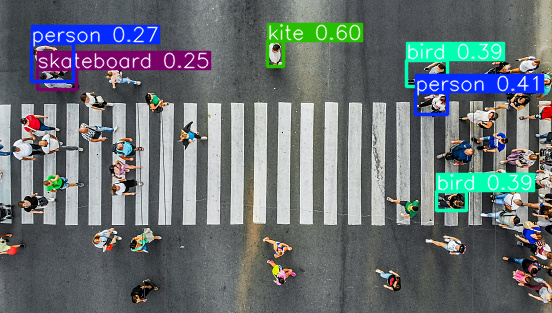

In [17]:
results.show()

Как видишь, на этих картинках результаты достаточно скудные. Как думаешь, почему?

# Задание 2

1. В папку `datasets/images/task-2` добавь изображения, на которых ты бы хотел протестировать работу алгоритма. Алгоритм обучен на датасете [COCO](https://cocodataset.org/#explore).
2. Протестируй модель на выбранных изображениях. Проанализируй результаты модели.
3. Если на каких-то изображениях модель продемонстрировала неточные предсказания, то опиши возможную причину.